# COVID-19 notifications by selected perimeters
This jupyter notebook creates epidemiologic comparative charts from user-defined geographic perimeters

## Imports, functions and variables

In [1]:
import pandas as pd
from datetime import datetime, timedelta
import os

import matplotlib as plt
import seaborn as sns
import numpy as np
import re

new_rc_params = {'text.usetex': False,
"svg.fonttype": 'none'
}
plt.rcParams.update(new_rc_params)

In [2]:
### Styling
SNS_CONTEXT = 'paper'
SNS_STYLE = 'darkgrid'
SNS_PALLETE = 'Set1'
SNS_FONT = 'Fira Sans'

### Data
TIME_STEP = 15 ### Time interval for aggregation, in days
INHABITANT_RATIO = 10000 ### Value to multiply relative indexes ("per x inhabitants")
STRATA_INTERVAL = 10 ### Interval between demographic strata, in years
CEIL_AGE = 100 ### Defines the cut-line for the last stratum

_inch = 1/25.4

def getStratum(age, step=STRATA_INTERVAL, ceil_age=CEIL_AGE):
    '''
    Returns the name of the stratum of a certain age, given the strata interval
    '''
    round_ceil = (ceil_age//step)*step
    if age<round_ceil:
        tag_floor = str(int(age//step)*step)
        if (int(age//step + 1)*step)-1 >= round_ceil:
            tag_ceil = str(round_ceil-1)
        else:
            tag_ceil = str((int(age//step + 1)*step)-1)
        return f'{tag_floor}to{tag_ceil}'
    else:
        tag_limit = str(int(round_ceil//step)*step)
        return f'get{tag_limit}'

def getSexStratum(sex, age, step=STRATA_INTERVAL, ceil_age=CEIL_AGE):
    '''
    Returns the name of the stratum of a certain age and sex, given the strata interval
    '''
    if sex.upper().startswith('F'):
        sex_tag = 'F'
    elif sex.upper().startswith('M'):
        sex_tag = 'M'
    else:
        print(f'"{sex}" will not match demographic data')
        raise Exception
    stratum_tag = getStratum(age, step, ceil_age)
    return f'{sex_tag}_{stratum_tag}'

def assembleStrataDict(step=STRATA_INTERVAL, ceil_age=CEIL_AGE):
    '''
    Defines the standard names for strata
    '''
    assert step >= 1
    round_ceil = (CEIL_AGE//step)*step
    
    i_var = 35 # Index of first variable with demographic data at IBGE files
    i_step = 0
    dic_out = {}
    while i_step < round_ceil:
        tag = getStratum((i_step),step)
        if i_step == 0:
            dic_out[tag] = ['V'+('000'+str(x))[-3:] for x in range(i_var,(i_var+step-1))]+['V022']
            i_var -= 1
        else: 
            dic_out[tag] = ['V'+('000'+str(x))[-3:] for x in range(i_var,i_var+step)]
        i_var += step
        i_step += step
    
    ### Create greater-than-ceil tag
    tag = getStratum((i_step),step) 
    dic_out[tag] = ['V'+('000'+str(x))[-3:] for x in range(i_var,135)]
    
    return dic_out

STRATA = assembleStrataDict()

def stratify(df):
    '''
    Stratifies a DataFrame containing IBGE demographic data columns assembled with assembleStrataDict function
    '''
    new_df = df.copy()
    for k, values in STRATA.items():
        new_df[k] = df.loc[:,values].sum(axis=1)
    new_df.fillna(0,inplace=True)
    return new_df

def dropAccessoryData(df_strata):
    '''
    Clears a DataFrame from data not related to stratification
    '''
    ks = ['Cod_setor']+list(STRATA.keys())
    out_df = df_strata[ks]
    return out_df
    
def getFortnight(datestring, dateformat='%Y-%m-%d', zerodate = datetime(2020,1,1)):
    '''
    Returns the sequetial number and start date of the fortnight from a given datestring
    '''
    datetarget = datetime.strptime(datestring, dateformat)
    datedelta = datetarget - zerodate
    deltadays = datedelta.days
    fortnight = (deltadays//15) + 1
    refday = zerodate + timedelta(days=(fortnight-1)*15)
    
    d = {'text':f'{("00"+str(fortnight))[-2:]} ({datetarget.year})',
         'refday':refday}
    return d

def getWeek(datestring, dateformat='%Y-%m-%d', zerodate = datetime(2020,1,1)):
    '''
    Returns the sequetial number and start date of the week from a given datestring
    '''
    datetarget = datetime.strptime(datestring, dateformat)
    datedelta = datetarget - zerodate
    deltadays = datedelta.days
    week = (deltadays//7) + 1
    refday = zerodate + timedelta(days=(week-1)*7)
    
    d = {'text':f'{("000"+str(week))[-3:]} ({datetarget.year})',
         'refday':refday}
    return d

def getTimeRangeTags(datestring, dateformat='%Y-%m-%d', zerodate = datetime(2020,1,1)):
    '''
    Returns the sequetial number and start date of the week from a given datestring
    '''
    datetarget = datetime.strptime(datestring, dateformat)
    datedelta = datetarget - zerodate
    deltadays = datedelta.days
    timetag = (deltadays//TIME_STEP) + 1
    refday = zerodate + timedelta(days=(timetag-1)*TIME_STEP)
    
    d = {'text':f'{("000"+str(timetag))[-3:]} ({datetarget.year})',
         'refday':refday}
    return d

def _standardizeItemToStdPop(s, r, p, pyramid_dict):
    try:
        out = (p/pyramid_dict[r][s])*pyramid_dict['StandardPop'][s]
        return out
    except ZeroDivisionError:
        return 0
    
def _standardizeItem(s, r, p, pyramid_dict):
    try:
        out = (p/pyramid_dict[r][s])
        return out
    except ZeroDivisionError:
        return 0
    
def getSemester(date):
    if date < datetime(2020,1,1):
        return '201X'
    elif date < datetime(2020,7,2):
        return '2020.1'
    elif date < datetime(2021,1,1):
        return '2020.2'
    elif date < datetime(2021,7,1):
        return '2021.1'
    elif date < datetime(2022,1,1):
        return '2021.2'
    elif date < datetime(2022,7,1):
        return '2022.1'
    else:
        return '2022.2'

def standardizeStrata(df, region):
    '''
    Standardizes a DataFrame with age and sex strata 
    '''
    df_temp = df.query('geosample == @region').pivot_table(index='TIME_STEP_REF', columns='STRATUM',values='geosample', aggfunc='count').fillna(0)
    target_cols = list(df_temp.columns)

    ### Calculate equivalent population
    for stratum in target_cols:
        df_temp[stratum] = df_temp[stratum].apply(lambda x: _standardizeItemToStdPop(stratum, region, x, PopPyramidData))
    df_temp['STD_TOTAL'] = df_temp.sum(axis=1)
    df_temp['STD_INDEX'] = (df_temp['STD_TOTAL']/StdTotalPop['StandardPop'])*INHABITANT_RATIO
    
    ### Calculate simple strata incidence
    for stratum in target_cols:
        df_temp['STD_{stratum}'] = df_temp[stratum].apply(lambda x: _standardizeItem(stratum, region, x, PopPyramidData))
    
    df_temp = df_temp.reset_index()

    return df_temp[['TIME_STEP_REF','STD_TOTAL','STD_INDEX']]

def standardizeTotal(df, region):
    '''
    Standardizes a DataFrame with total population of a region
    '''
    df_temp = df.query('geosample == @region').pivot_table(index='TIME_STEP_REF',values='geosample', aggfunc='count').fillna(0).rename(columns={'geosample':'TOTAL'})
    df_temp['STD_TOTAL'] = df_temp.sum(axis=1)
    df_temp['STD_INDEX'] = (df_temp['STD_TOTAL']/StdTotalPop[region])*INHABITANT_RATIO
    df_temp = df_temp.reset_index()

    return df_temp[['TIME_STEP_REF','STD_TOTAL','STD_INDEX']]

def standardizeSivep(df_in):
    '''
    Standardizes a DataFrame with SIVEP hospitalization data
    '''
    ### Creates list of timesteps
    df_timerange = df_in['TIME_STEP_REF'].drop_duplicates().to_frame().sort_values(by='TIME_STEP_REF')
    df_in_std = pd.DataFrame()

    for reg in df_in['geosample'].unique().tolist():
        df_std_temp = standardizeStrata(df_in, reg)
        df_std_temp = df_timerange.merge(df_std_temp, on='TIME_STEP_REF', how='left').fillna(0)
        df_std_temp['geosample'] = reg
        df_in_std = pd.concat([df_in_std, df_std_temp])

    df_in_std = df_in_std.reset_index()
    
    return df_in_std

def standardizeESUS(df_in):
    '''
    Standardizes a DataFrame with eSUS notification data
    '''
    ### Creates list of timesteps
    df_timerange = df_in['TIME_STEP_REF'].drop_duplicates().to_frame().sort_values(by='TIME_STEP_REF')
    df_in_std = pd.DataFrame()

    for reg in df_in['geosample'].unique().tolist():
        df_std_temp = standardizeTotal(df_in, reg)
        df_std_temp = df_timerange.merge(df_std_temp, on='TIME_STEP_REF', how='left').fillna(0)
        df_std_temp['geosample'] = reg
        df_in_std = pd.concat([df_in_std, df_std_temp])

    df_in_std = df_in_std.reset_index()
    
    return df_in_std

def _plotVLine(dateitem, ax_list):
    _pond = 0.7
    for ax in ax_list:
        ymin, ymax = ax.get_ylim()
        ycoord = ymax*_pond
        date = plt.dates.date2num(dateitem['date'])
        ax.axvline(x=date, ymin=0, ymax=_pond, color=dateitem['color'], linestyle=(0,(5,5)), linewidth=0.6)
        ax.annotate(dateitem['name'],(date, ycoord), size=8, color=dateitem['color'], fontweight='regular', rotation=90, annotation_clip=True, horizontalalignment='center', verticalalignment='baseline')
        
def _plotRectangle(dateitem, ax_list):
    top_offset, bottom_offset = dateitem['offsets']
    for ax in ax_list:
        ymin, ymax = ax.get_ylim()
        height_plot = (ymax-ymin)
        yoffset = (height_plot*bottom_offset)
        height = height_plot - (height_plot*top_offset) - yoffset
        ycenter = (height/2)+yoffset

        datestart = plt.dates.date2num(dateitem['start'])
        dateend = plt.dates.date2num(dateitem['end'])
        datewidth = dateend - datestart
        rect = plt.patches.Rectangle((datestart, yoffset), datewidth, height, color=dateitem['color'], alpha=0.15, linestyle='')
        ax.add_patch(rect)
        ax.annotate(dateitem['name'],(datestart, ycenter), size=8, color=dateitem['color'], fontweight='regular', rotation=90, annotation_clip=True, horizontalalignment='right', verticalalignment='center')

def plotStandardizedDataFrame(df_in, dateitems=None, figsize_mm=(300,150), title=None, savefig=True):
    '''
    Creates a lineplot from a standardized DataFrame
    '''
    plotdata = df_in.groupby('geosample')
    
    sns.set_theme(context=SNS_CONTEXT,style=SNS_STYLE,font=SNS_FONT)
    sns.set_palette(SNS_PALLETE, len(plotdata))

    fig, axes = plt.pyplot.subplots(2, 1, sharex=True, figsize=(figsize_mm[0]*_inch, figsize_mm[1]*_inch), dpi=300)
    
    ### Plot zero line
    for ax in axes:
        ax.axhline(y=0, color='gray', linewidth=0.75)
    
    ### Plot data
    for name, group in plotdata:
        group['STD_INDEX_CUM'] = group['STD_INDEX'].cumsum()
        group.plot(x='TIME_STEP_REF',y='STD_INDEX', ax=axes[0], label=name, style='.-', ms=4)
        group.plot(x='TIME_STEP_REF',y='STD_INDEX_CUM', ax=axes[1], label=name, style='.-', ms=4)
    
    ### X-Axis range
    axes[0].set_xlim(datetime(2020,1,1),datetime(2021,12,31))
    axes[0].xaxis.set_major_locator(plt.dates.MonthLocator())
    
    ### Title
    if title:
        fig.suptitle(title, fontsize=14, fontweight='bold')
    
    ### Subtitles
    axes[0].set_title(f'{TIME_STEP}-day incidence per {INHABITANT_RATIO:,} inhabitants', fontsize=11, loc='center', pad=-13)
    axes[1].set_title(f'{TIME_STEP}-day accumulated incidence per {INHABITANT_RATIO:,} inhabitants', fontsize=11, loc='center', pad=-13)
    
    ### Annotations
    if dateitems:
        for dategroup in dateitems:
            for d in dategroup['data']:
                if dategroup['type'] == 'rectangles':
                    _plotRectangle(d, axes)
                elif dategroup['type'] == 'vlines':
                    _plotVLine(d, axes)
                else:
                    continue
                    
    ### Layout 
    plt.pyplot.xlabel('')
    axes[0].xaxis.set_major_formatter(plt.dates.DateFormatter('%Y\n%b'))
    for tick in axes[1].xaxis.get_majorticklabels():
        tick.set_horizontalalignment("left")
    axes[0].xaxis.set_tick_params(rotation=0)
    axes[1].xaxis.set_tick_params(rotation=0)
    fig.tight_layout()
    
    ### Export
    if savefig:
        plt.pyplot.savefig(f'plots/{title}_{TIME_STEP}dayagg.svg')
    plt.pyplot.show()
    
def plotStandardizedSemesterSumDataFrame(df_in, dateitems=None, figsize_mm=(300,150), title=None, savefig=True):
    '''
    Creates a lineplot from a standardized DataFrame
    '''
    plotdata = df_in.groupby('geosample')
    
    sns.set_theme(context=SNS_CONTEXT,style=SNS_STYLE,font=SNS_FONT)
    sns.set_palette(SNS_PALLETE, len(plotdata))

    fig, axes = plt.pyplot.subplots(2, 1, sharex=True, figsize=(figsize_mm[0]*_inch, figsize_mm[1]*_inch), dpi=300)
    
    ### Plot zero line
    for ax in axes:
        ax.axhline(y=0, color='gray', linewidth=0.75)
    
    ### Plot data
    colors = sns.color_palette(SNS_PALLETE, len(plotdata))
    
    for (name, group), c in zip(plotdata, colors):
        group.plot(x='TIME_STEP_REF',y='STD_INDEX', ax=axes[0], label=name, style='.-', ms=4, color=c)
        group['SEMESTER'] = group['TIME_STEP_REF'].apply(getSemester)
        #group['STD_INDEX_CUM'] = group.groupby('SEMESTER').apply(lambda x: x['STD_INDEX'].cumsum()).reset_index(level=0, drop=True)
        #group.plot(x='TIME_STEP_REF',y='STD_INDEX_CUM', ax=axes[1], label=name, style='.-', ms=4)
        
        for subname, subgroup in group.groupby('SEMESTER'):
            subgroup['STD_INDEX_CUM'] = subgroup['STD_INDEX'].cumsum()
            subgroup.plot(x='TIME_STEP_REF',y='STD_INDEX_CUM', ax=axes[1], label=name, style='.-', ms=4, color=c)
    
    ### X-Axis range
    axes[0].set_xlim(datetime(2020,1,1),datetime(2021,12,31))
    axes[0].xaxis.set_major_locator(plt.dates.MonthLocator())
    
    axes[1].get_legend().remove()
    
    ### Title
    if title:
        fig.suptitle(title, fontsize=14, fontweight='bold')
    
    ### Subtitles
    axes[0].set_title(f'{TIME_STEP}-day incidence per {INHABITANT_RATIO:,} inhabitants', fontsize=11, loc='center', pad=-13)
    axes[1].set_title(f'Semiannual {TIME_STEP}-day accumulated incidence per {INHABITANT_RATIO:,} inhabitants', fontsize=11, loc='center', pad=-13)
    
    ### Annotations
    if dateitems:
        for dategroup in dateitems:
            for d in dategroup['data']:
                if dategroup['type'] == 'rectangles':
                    _plotRectangle(d, axes)
                elif dategroup['type'] == 'vlines':
                    _plotVLine(d, axes)
                else:
                    continue
                    
    ### Layout 
    plt.pyplot.xlabel('')
    axes[0].xaxis.set_major_formatter(plt.dates.DateFormatter('%Y\n%b'))
    for tick in axes[1].xaxis.get_majorticklabels():
        tick.set_horizontalalignment("left")
    axes[0].xaxis.set_tick_params(rotation=0)
    axes[1].xaxis.set_tick_params(rotation=0)
    fig.tight_layout()
    
    ### Export
    if savefig:
        plt.pyplot.savefig(f'plots/{title}_{TIME_STEP}dayagg.svg')
    plt.pyplot.show()

## Data preparation

### 1. Key dates
Data structure with relevant dates for plotting

In [3]:
COLOR_0 = '#444444'
COLOR_1 = 'dimgray'
COLOR_2 = 'darkgray'

KEY_DATES = [
    {
        'type':'vlines',
        'data':[
            {
                'name':'Restrictions',
                'date' : datetime(2020,3,20),
                'color':COLOR_0
            },{
                'name':'Facial Masks',
                'date' : datetime(2020,5,4),
                'color':COLOR_0
            },{
                'name':'1D EssW',
                'date' : datetime(2021,1,17),
                'color':COLOR_1
            },{
                'name':'1D 90+',
                'date' : datetime(2021,2,5),
                'color':COLOR_1
            },{
                'name':'1D 80+',
                'date' : datetime(2021,2,27),
                'color':COLOR_1
            },{
                'name':'1D 69+',
                'date' : datetime(2021,3,26),
                'color':COLOR_1
            },{
                'name':'1D 60+',
                'date' : datetime(2021,5,6),
                'color':COLOR_1
            },{
                'name':'1D 50+',
                'date' : datetime(2021,6,19),
                'color':COLOR_1
            },{
                'name':'1D 40+',
                'date' : datetime(2021,7,7),
                'color':COLOR_1
            },{
                'name':'1D 30+',
                'date' : datetime(2021,7,23),
                'color':COLOR_1
            },{
                'name':'1D 22+',
                'date' : datetime(2021,8,14),
                'color':COLOR_1
            },{
                'name':'1D 12+',
                'date' : datetime(2021,9,6),
                'color':COLOR_1
            },{
                'name':'3D 85+',
                'date' : datetime(2021,9,13),
                'color':COLOR_2
            },{
                'name':'3D 80+',
                'date' : datetime(2021,9,20),
                'color':COLOR_2
            },{
                'name':'3D 75+',
                'date' : datetime(2021,9,27),
                'color':COLOR_2
            },{
                'name':'3D 60+',
                'date' : datetime(2021,10,4),
                'color':COLOR_2
            },{
                'name':'3D 18+',
                'date' : datetime(2021,11,18),
                'color':COLOR_2
            }            
        ]},
    
    {
        'type':'rectangles',
        'data':[
            {
                'name':'Aid 2020 (R$600)',
                'start' : datetime(2020,4,27),
                'end' : datetime(2020,9,30),
                'color':'chocolate',
                'offsets':(0.1,0.0)
            },{
                'name':'Aid 2020 (R$300)',
                'start' : datetime(2020,9,30),
                'end' : datetime(2020,12,13),
                'color':'orange',
                'offsets':(0.1,0.0)
            },{
                'name':'Aid 2020 (R$150 – 375)',
                'start' : datetime(2021,4,6),
                'end' : datetime(2021,10,20),
                'color':'yellowgreen',
                'offsets':(0.1,0.0)
            },
        ]},
]

### 2. IBGE 2010 Census
Imports data from IBGE 2010 Census from two base files (Pessoa12 and Pessoa11)

In [4]:
# Female strata
pessoa12a = pd.read_csv(r"..\ibge\Pessoa12_SP1.csv",sep=';',dtype={'Cod_setor':str})
pessoa12b = pd.read_csv(r"..\ibge\Pessoa12_SP.csv",sep=';',dtype={'Cod_setor':str})
pessoa12 = pessoa12a.append(pessoa12b)
pessoa12 = pessoa12.replace('X','0')
convert = [i for i in pessoa12.keys() if i.startswith('V')]
convert = {k:int for k in convert}
pessoa12 = pessoa12.astype(convert)

PopSP_F = stratify(pessoa12)
PopSP_F = dropAccessoryData(PopSP_F)

# Male strata
pessoa11a = pd.read_csv(r"..\ibge\Pessoa11_SP1.csv",sep=';',dtype={'Cod_setor':str})
pessoa11b = pd.read_csv(r"..\ibge\Pessoa11_SP.csv",sep=';',dtype={'Cod_setor':str})
pessoa11 = pessoa11a.append(pessoa11b)
pessoa11 = pessoa11.replace('X','0')
convert = [i for i in pessoa11.keys() if i.startswith('V')]
convert = {k:int for k in convert}
pessoa11 = pessoa11.astype(convert)

PopSP_M = stratify(pessoa11)
PopSP_M = dropAccessoryData(PopSP_M)

# Total strata
PopSP_F = PopSP_F.set_index('Cod_setor')
PopSP_F.rename(columns={i:('F_'+i) for i in PopSP_F.keys()},inplace=True)
PopSP_M = PopSP_M.set_index('Cod_setor')
PopSP_M.rename(columns={i:('M_'+i) for i in PopSP_M.keys()},inplace=True)

PopSP = PopSP_F.join(PopSP_M)
PYRAMID_KEYS = list(PopSP.keys())
PopSP = PopSP.reset_index().rename(columns={'Cod_setor':'tract_id'})
PopSP.head()

C:\Users\Desktop\AppData\Local\Temp\ipykernel_13252\3017862884.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pessoa12 = pessoa12a.append(pessoa12b)
C:\Users\Desktop\AppData\Local\Temp\ipykernel_13252\3017862884.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pessoa11 = pessoa11a.append(pessoa11b)


,tract_id,F_0to9,F_10to19,F_20to29,F_30to39,F_40to49,F_50to59,F_60to69,F_70to79,F_80to89,...,M_10to19,M_20to29,M_30to39,M_40to49,M_50to59,M_60to69,M_70to79,M_80to89,M_90to99,M_get100
0,355030801000001,29,54,52,57,70,68,35,40,22,...,45,68,56,59,52,26,22,12,1,0
1,355030801000002,49,51,64,86,68,67,46,41,19,...,64,60,66,58,51,30,23,12,0,0
2,355030801000003,33,31,41,58,46,45,35,27,12,...,35,54,49,39,36,29,15,6,1,0
3,355030801000004,31,33,47,43,46,40,28,19,7,...,43,56,47,37,32,16,9,4,4,1
4,355030801000005,41,41,73,60,70,36,41,23,12,...,61,66,53,47,31,28,16,10,1,0


### 3. IBGE Geosamples
Defines the geographic samples for analysis using IBGE census tracts

In [5]:
#sample_tags = ['Heliópolis', 'Paraisópolis']
#sample_tags = ['Cohab 1', 'Cohab JB', 'Cid Tiradentes']
#sample_tags = ['Morumbi', 'Higienópolis', 'Jd Paulista']
#sample_tags = ['Morumbi', 'Paraisópolis']

df_stdregion = pd.read_csv(r"data\census_stdregion.txt",dtype={'CD_GEOCODI':str})
df_stdregion = df_stdregion.rename(columns={'CD_GEOCODI':'tract_id'})

# Select file defining groups of census tracts below
df_geosamples = pd.read_csv(r"data\census_geosamples_saomateus.txt",dtype={'CD_GEOCODI':str,'geosample':str},sep='\t')
df_geosamples = df_geosamples.rename(columns={'CD_GEOCODI':'tract_id'})
#df_geosamples = df_geosamples.query('geosample in @sample_tags')

df_std_data = df_stdregion.merge(df_geosamples, on='tract_id',how='left').fillna('São Paulo') # Allocates entries with no tract_id to São Paulo
df_std_data

,tract_id,geosample
0,355030804000079,São Paulo
1,355030804000080,São Paulo
2,355030804000081,São Paulo
3,355030804000082,São Paulo
4,355030804000083,São Paulo
...,...,...
18948,355030896000243,São Paulo
18949,355030896000244,São Paulo
18950,355030896000245,São Paulo
18951,355030896000246,São Paulo


In [6]:
### Aggregates data into a population pyramid structure
PopPyramidData = dict() # Description of stratified populations in different perimeters

### Stratified population for the municipality of São Paulo
df_std_data = pd.merge(df_std_data,PopSP,how='left',on='tract_id')
StdPop = df_std_data.sum(axis=0)
StdPop = StdPop.to_dict()
StdPop.pop('tract_id')
StdPop.pop('geosample')

PopPyramidData['StandardPop'] = StdPop

### Stratified population for sample regions
for sample in df_std_data['geosample'].unique().tolist():
    df_temp = df_std_data.query('geosample == @sample')
    #df_temp = pd.merge(df_temp, PopSP, how='left', on='tract_id')
    StdPop = df_temp.sum(axis=0)
    StdPop = StdPop.to_dict()
    StdPop.pop('tract_id')
    StdPop.pop('geosample')
    PopPyramidData[sample] = StdPop
    
### Total population of each region
StdTotalPop = dict()
for reg, popdict in PopPyramidData.items():
    poptot = int(sum(popdict.values()))
    StdTotalPop[reg] = poptot

### 4. SIVEP

Imports hospitalization data from SIVEP, [downloaded from São Paulo Secretary of Health](https://www.prefeitura.sp.gov.br/cidade/secretarias/saude/vigilancia_em_saude/doencas_e_agravos/coronavirus/index.php?p=313773), and standardizes region and time aggregates with the following equation

### ${StdIncidence_{region}} = \frac{\sum_{stratum}^{n}\frac{Sivep_{stratum}}{Pop_{stratum}}*{StdPop_{stratum}}}{\sum_{stratum}^{n}{StdPop_{stratum}}} * N$

where $Sivep_{stratum}$ is the total number of hospitalizations or deaths in the region for a given stratum, $Pop_{stratum}$ is the total population of this stratum in the region and $StdPop_{stratum}$ is the total population of this stratum in the standard population (the Municipality of São Paulo). The variable $N$ is an arbitrary value that scales the incidence indicator (i.e. "per N inhabitants"). The variables are contained by the following objects:

|Variable|Object name|
|--------|-----------|
|$Sivep_{stratum}$|`df_sivep_all` and `df_sivep_deaths`, aggregation required|
|$Pop_{stratum}$|`PopPyramidData[region]`|
|$StdPop_{stratum}$|`PopPyramidData['StandardPop']`|
|$N$|`INHABITANT_RATIO`|

#### Import data

In [7]:
df_sivep = pd.read_csv('data/dados-srag-sivep-sao-paulo-sp.csv', encoding='latin-1',sep=';', dtype={'SETOR_CENSITARIO':str},low_memory=False)
df_sivep.head()

,SETOR_CENSITARIO,ID,DT_NOTIFIC,SEM_NOT,DT_SIN_PRI,SEM_PRI,SG_UF_NOT,ID_REGIONA,CO_REGIONA,ID_MUNICIP,...,POV_CT,TP_POV_CT,TEM_CPF,ESTRANG,VACINA_COV,DOSE_1_COV,DOSE_2_COV,LOTE_1_COV,LOTE_2_COV,FNT_IN_COV
0,355030838000131,1624377261,2020-01-02,202001,2019-12-30,202001,SP,GVE I CAPITAL,1331.0,SAO PAULO,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,355030896000183,1624377262,2020-01-02,202001,2019-12-29,202001,SP,GVE I CAPITAL,1331.0,SAO PAULO,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,355030843000149,1624377263,2020-01-02,202001,2019-12-30,202001,SP,GVE I CAPITAL,1331.0,SAO PAULO,...,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,355030819000297,1624377264,2020-01-03,202001,2019-12-29,202001,SP,GVE I CAPITAL,1331.0,SAO PAULO,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,355030819000152,1624377265,2020-01-03,202001,2019-12-30,202001,SP,GVE I CAPITAL,1331.0,SAO PAULO,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Data preparation

In [8]:
df_sivep = df_sivep.rename(columns={'SETOR_CENSITARIO':'tract_id'})
df_sivep = df_sivep.merge(df_std_data, on='tract_id', how='left')
df_sivep = df_sivep.dropna(subset=['DT_SIN_PRI'])

df_sivep['TIME_STEP'] = df_sivep['DT_SIN_PRI'].apply(lambda x: getTimeRangeTags(x)['text']) # Names the time step of the first symptoms
df_sivep['TIME_STEP_REF'] = df_sivep['DT_SIN_PRI'].apply(lambda x: getTimeRangeTags(x)['refday']) # Dates the time step of the first symptoms
df_sivep['STRATUM'] = df_sivep.apply(lambda x: getSexStratum(x['CS_SEXO'], x['IDADE']), axis=1) # Names the stratum of each patient
df_sivep['geosample'] = df_sivep['geosample'].fillna('São Paulo')

### Select COVID-19 hospitalizations
df_sivep_all = df_sivep[df_sivep['CLASSI_FIN_MOD']==5]

### Select COVID-19 deaths after hospitalization
df_sivep_deaths = df_sivep_all[df_sivep_all['EVOLUCAO']==2]

In [9]:
### Plot total hospitalizations
df_sivep_all.pivot_table(index='geosample',values='ID',aggfunc='count').reset_index()

,geosample,ID
0,IGUATEMI,1395
1,SAPOPEMBA,3551
2,SÃO MATEUS,2174
3,SÃO RAFAEL,1264
4,São Paulo,156916


In [10]:
### Plot total nosocomial deaths
df_sivep_deaths.pivot_table(index='geosample',values='ID',aggfunc='count').reset_index()

,geosample,ID
0,IGUATEMI,405
1,SAPOPEMBA,1169
2,SÃO MATEUS,588
3,SÃO RAFAEL,398
4,São Paulo,39540


#### Share of healthcare workers

In [11]:
df_cbos = pd.read_csv('data/cbo_2002.txt', sep='\t').rename(columns={'CBO 2002':'PAC_COCBO', 'Títulos':'CBO_NAME', 'Tipo':'TYPE'})
df_cbos['PAC_COCBO'] = df_cbos['PAC_COCBO'].apply(lambda x: x.replace('-',''))
df_cbos

,PAC_COCBO,CBO_NAME,TYPE
0,612510,Abacaxicultor,Sinônimo
1,263105,Abade,Sinônimo
2,263105,Abadessa,Sinônimo
3,622020,Abanador na agricultura,Sinônimo
4,862120,Abastecedor de caldeira,Sinônimo
...,...,...,...
11053,263110,Zenji (missionário),Sinônimo
11054,723235,Zincador,Sinônimo
11055,203010,Zoologista,Sinônimo
11056,203010,Zoólogo,Sinônimo


#### Standardization and plotting

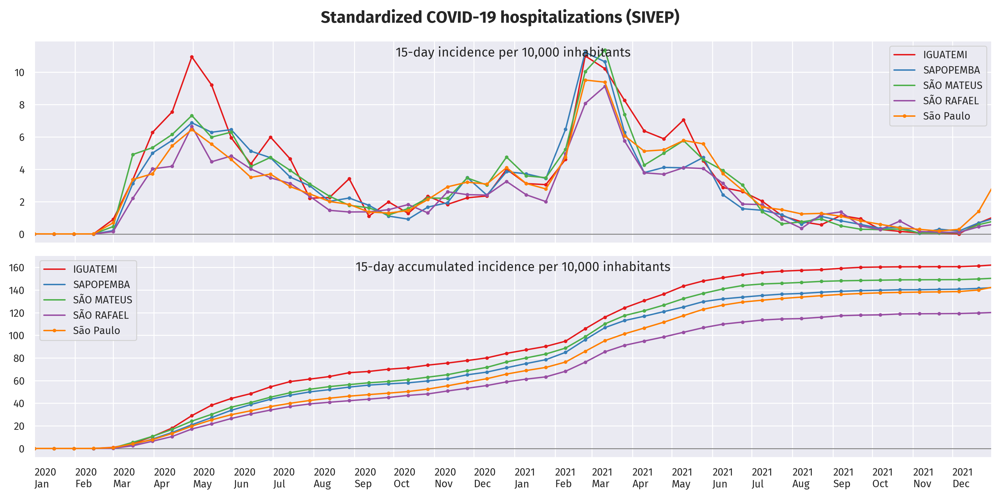

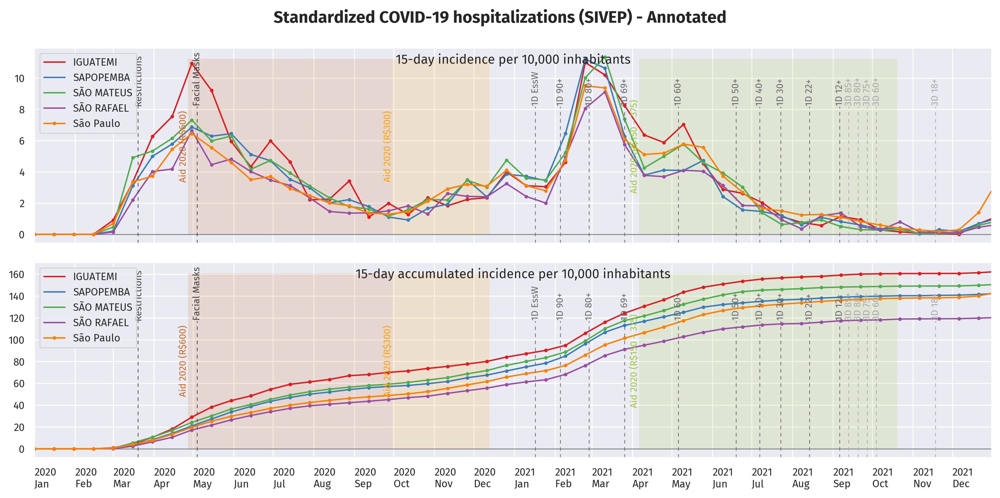

In [13]:
### All
df_sivep_all_std = standardizeSivep(df_sivep_all)
plotStandardizedDataFrame(df_sivep_all_std, title='Standardized COVID-19 hospitalizations (SIVEP)', savefig=False)
plotStandardizedDataFrame(df_sivep_all_std, KEY_DATES, title='Standardized COVID-19 hospitalizations (SIVEP) - Annotated', savefig=False)

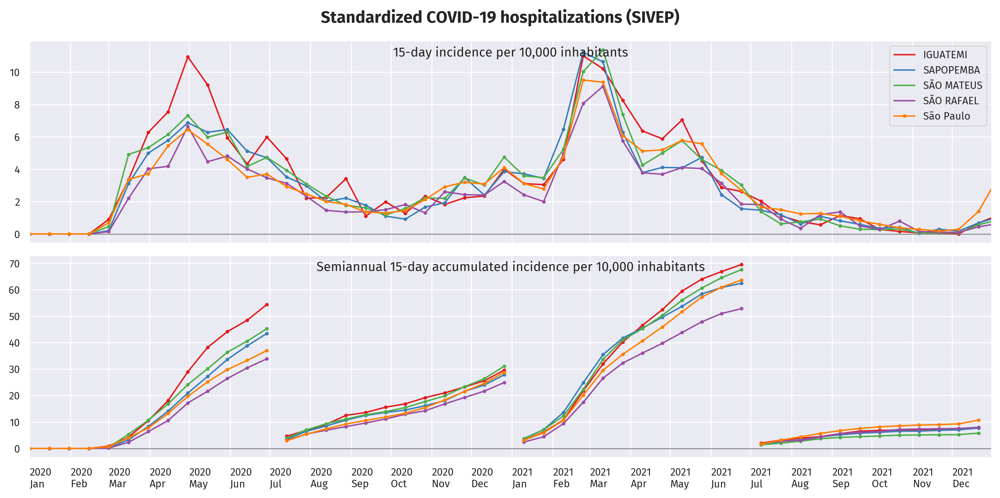

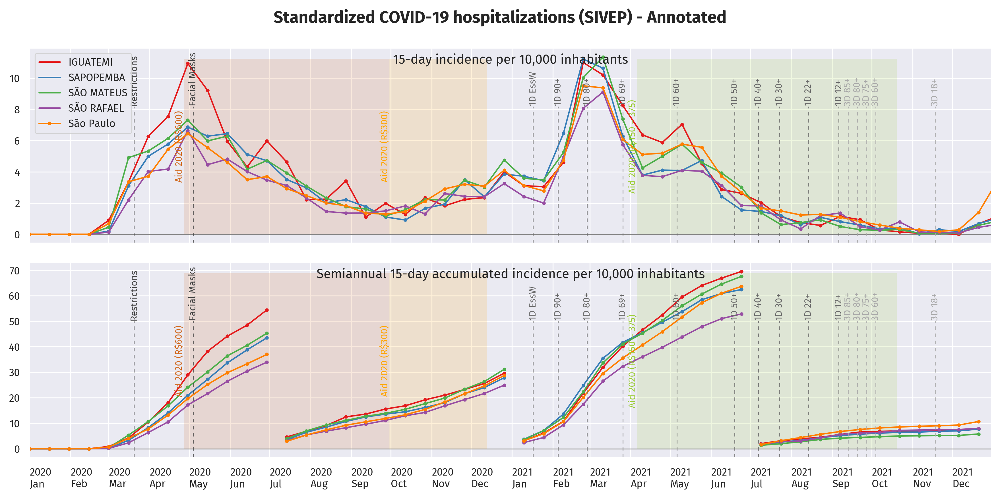

In [14]:
### Hospitalizations with cumsum by semester
df_sivep_all_std = standardizeSivep(df_sivep_all)
plotStandardizedSemesterSumDataFrame(df_sivep_all_std, title='Standardized COVID-19 hospitalizations (SIVEP)', savefig=False)
plotStandardizedSemesterSumDataFrame(df_sivep_all_std, KEY_DATES, title='Standardized COVID-19 hospitalizations (SIVEP) - Annotated', savefig=False)

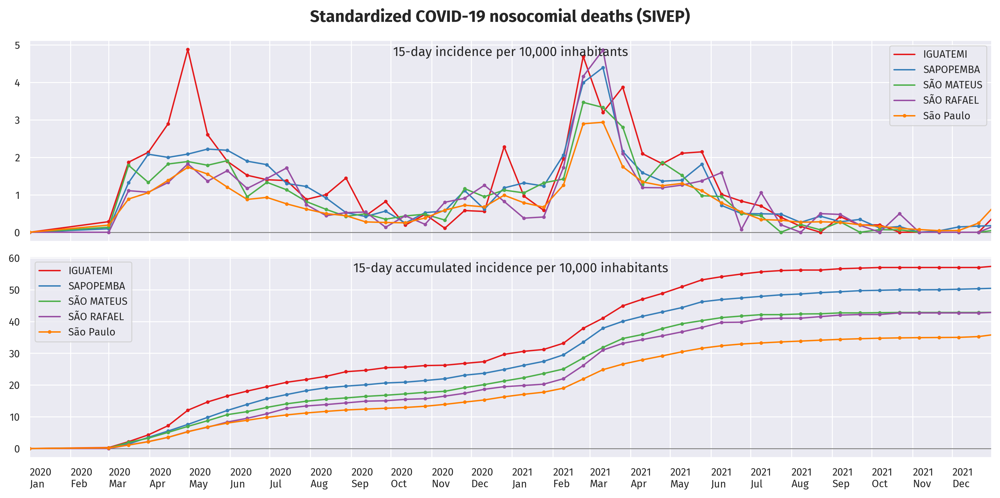

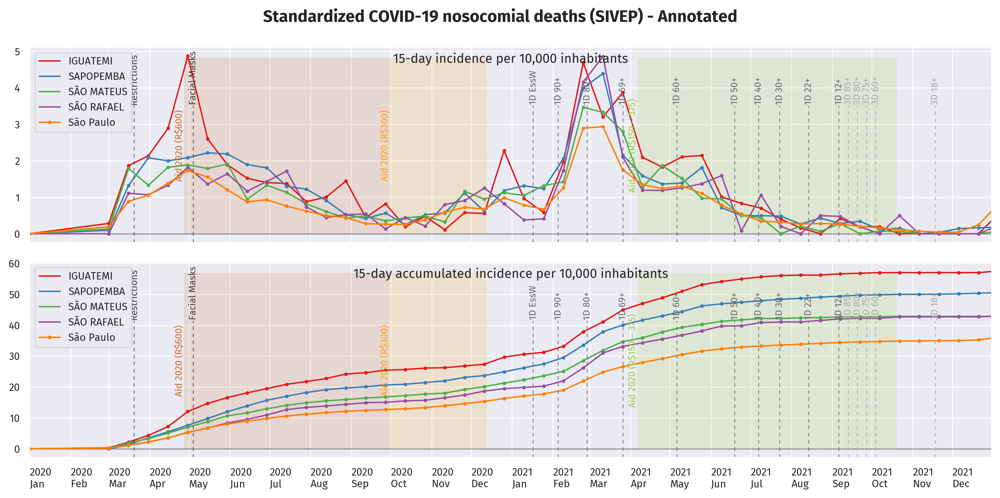

In [15]:
### Deaths
df_sivep_deaths_std = standardizeSivep(df_sivep_deaths)
plotStandardizedDataFrame(df_sivep_deaths_std, title='Standardized COVID-19 nosocomial deaths (SIVEP)', savefig=False)
plotStandardizedDataFrame(df_sivep_deaths_std, KEY_DATES, title='Standardized COVID-19 nosocomial deaths (SIVEP) - Annotated', savefig=False)

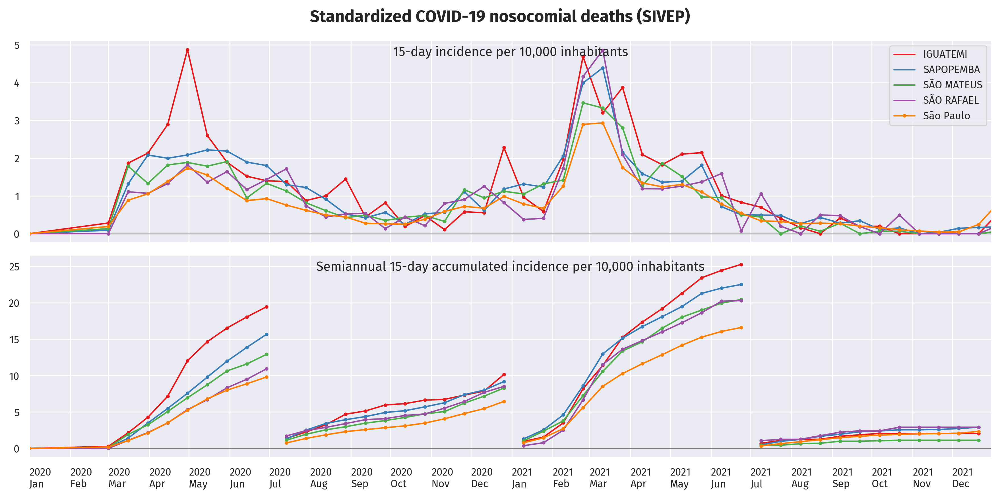

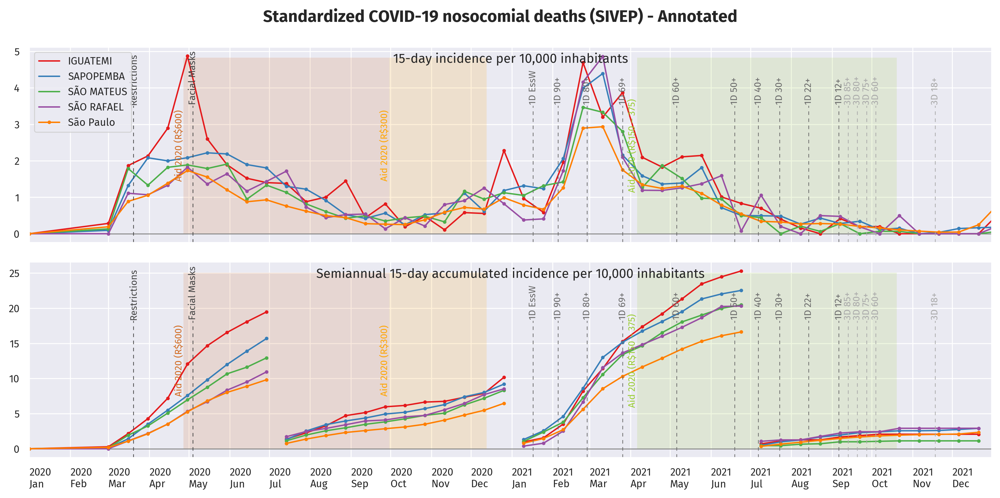

In [16]:
### Deaths by semester
df_sivep_deaths_std = standardizeSivep(df_sivep_deaths)
plotStandardizedSemesterSumDataFrame(df_sivep_deaths_std, title='Standardized COVID-19 nosocomial deaths (SIVEP)', savefig=False)
plotStandardizedSemesterSumDataFrame(df_sivep_deaths_std, KEY_DATES, title='Standardized COVID-19 nosocomial deaths (SIVEP) - Annotated', savefig=False)

### 5. eSUS

Imports notification data from eSUS, [downloaded from São Paulo Secretary of Health](https://www.prefeitura.sp.gov.br/cidade/secretarias/saude/vigilancia_em_saude/doencas_e_agravos/coronavirus/index.php?p=313773), and standardizes region and time aggregates with the following equation

### ${StdIncidence_{region}} = \frac{eSUS}{Pop} * N$

where $eSUS$ is the total number of COVID-19 notifications in the region, $Pop$ is the total population of the region and $N$ is an arbitrary value that scales the incidence indicator (i.e. "per N inhabitants"). The variables are contained by the following objects:

#### Import data

In [17]:
### Import data
df_esus = pd.DataFrame()
files = [i for i in os.listdir('data/esus') if i.endswith('.csv')]

for file in files:
    d = pd.read_csv(f'data/esus/{file}',sep=';', dtype={'setorCensitario':str}, low_memory=False)
    df_esus = pd.concat([df_esus,d])
    
df_esus.head()

,id,dataNotificacao,estrangeiro,paisOrigem,estadoNotificacao,municipioNotificacaoIBGE,dataNascimento,idade,sexo,racaCor,...,dataColetaTeste5,resultadoTeste5,tipoTeste6,estadoTeste6,dataColetaTeste6,resultadoTeste6,classificacaoFinal,classificacaoFinalModificada,evolucaoCaso,dataEncerramento
0,1645941330,2021-12-27,NaN,NaN,Rondonia,1100205.0,1995-06-16,26.0,Masculino,Branca,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN
1,1645720461,2021-12-28,NaN,NaN,Rondonia,1100023.0,1972-09-12,49.0,Masculino,Ignorado,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN
2,1645716957,2021-12-29,NaN,NaN,Rondonia,1100304.0,1992-10-10,29.0,Feminino,Branca,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN
3,1645740070,2021-12-30,NaN,NaN,Rondonia,1100205.0,1973-03-20,48.0,Feminino,Ignorado,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN
4,1645566321,2022-01-05,NaN,NaN,Rondonia,1100023.0,1991-12-20,30.0,Masculino,Parda,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,NaN,NaN


#### Data preparation

In [18]:
df_esus = df_esus.rename(columns={'setorCensitario':'tract_id'})
df_esus = df_esus.merge(df_std_data[['tract_id','geosample']], on='tract_id', how='left')
df_esus = df_esus.dropna(subset='dataInicioSintomas')

df_esus['TIME_STEP'] = df_esus['dataInicioSintomas'].apply(lambda x: getTimeRangeTags(x)['text']) # Names the time step of the first symptoms
df_esus['TIME_STEP_REF'] = df_esus['dataInicioSintomas'].apply(lambda x: getTimeRangeTags(x)['refday']) # Dates the time step of the first symptoms
df_esus['geosample'] = df_esus['geosample'].fillna('São Paulo') # Allocates entries with no tract_id to São Paulo

### Select positive COVID-19 notifications
df_esus_covid = df_esus[df_esus['classificacaoFinalModificada'] < 5]

### Select positive COVID-19 notifications
df_esus_tests = df_esus.dropna(subset='tipoTeste1')

In [19]:
### Plot total positive COVID-19 notifications
df_esus_covid.pivot_table(index='geosample',values='id',aggfunc='count').reset_index()

,geosample,id
0,IGUATEMI,37200
1,SAPOPEMBA,99152
2,SÃO MATEUS,40769
3,SÃO RAFAEL,39912
4,São Paulo,3404282


In [20]:
### Plot total testing
df_esus_tests.pivot_table(index='geosample',values='id',aggfunc='count').reset_index()

,geosample,id
0,IGUATEMI,39487
1,SAPOPEMBA,120335
2,SÃO MATEUS,47979
3,SÃO RAFAEL,44264
4,São Paulo,3992124


#### Standardization and plotting

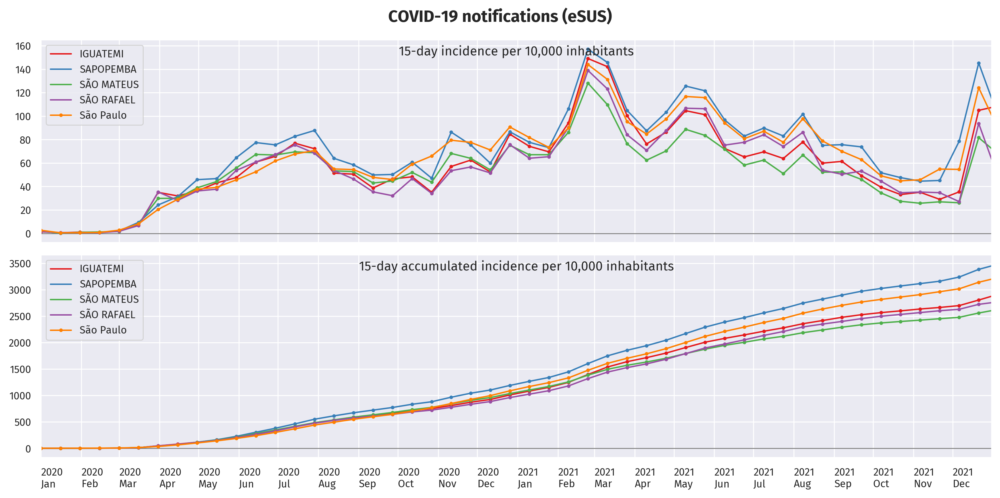

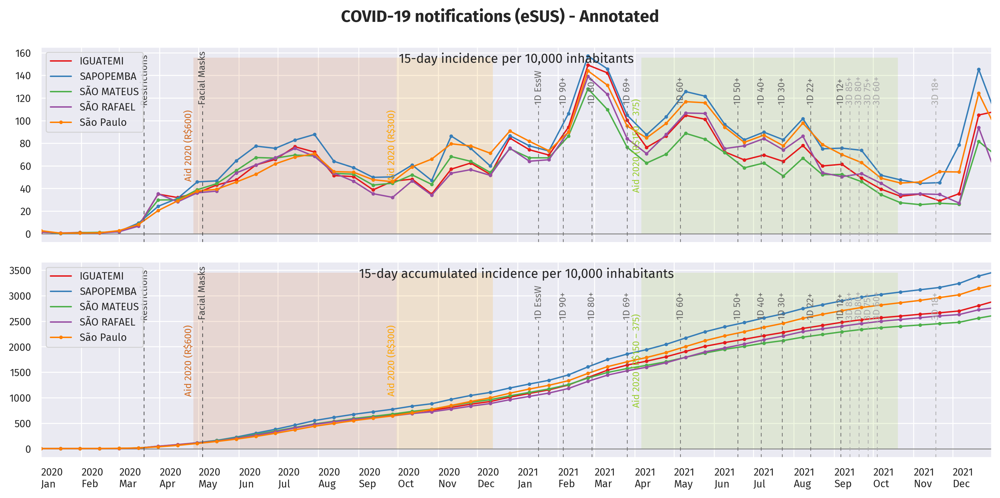

In [21]:
###Positive COVID-19 notifications
df_esus_covid_std = standardizeESUS(df_esus_covid)
plotStandardizedDataFrame(df_esus_covid_std,title='COVID-19 notifications (eSUS)', savefig=False)
plotStandardizedDataFrame(df_esus_covid_std, KEY_DATES, title='COVID-19 notifications (eSUS) - Annotated', savefig=False)

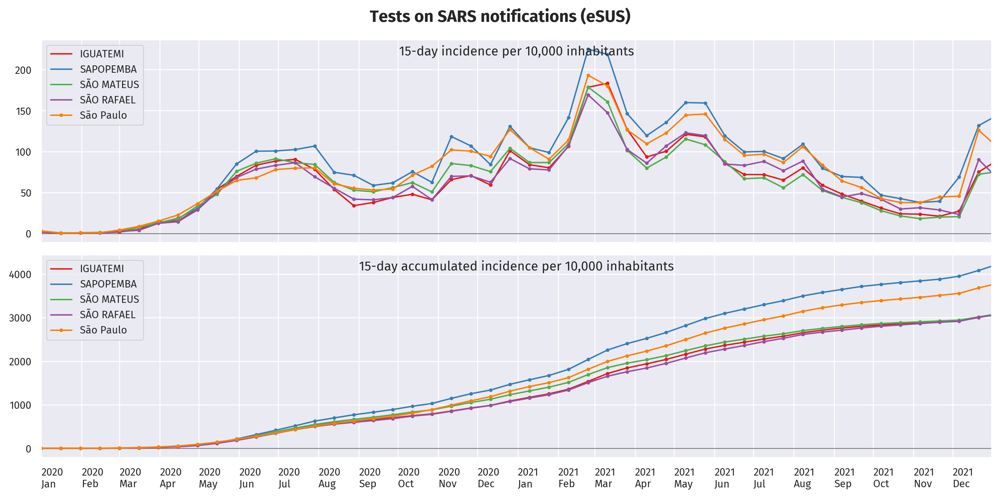

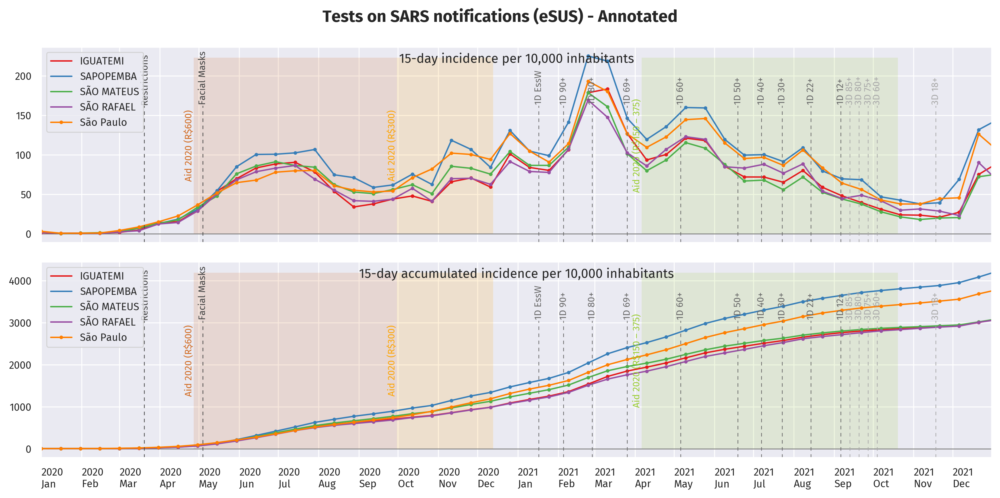

In [22]:
### SARS notifications 
df_esus_tests_std = standardizeESUS(df_esus_tests)
plotStandardizedDataFrame(df_esus_tests_std,title='Tests on SARS notifications (eSUS)', savefig=False)
plotStandardizedDataFrame(df_esus_tests_std, KEY_DATES, title='Tests on SARS notifications (eSUS) - Annotated', savefig=False)

## Population Pyramids

In [23]:
def plotPyramid(pyramid_data, region='', figsize=(10,10), dpi=80):
    '''
    Plots a pyramid using a population dictionary
    '''
    ### Prepare data
    df_pyramid = pd.DataFrame(data={'stratum':pyramid_data.keys(), 'population':pyramid_data.values()})
    TotalPop = df_pyramid['population'].sum()
    df_pyramid['sex_stratum'] = df_pyramid['stratum'].apply(lambda x: 'FEMALE' if x[0]=='F' else 'MALE')
    df_pyramid['age_stratum'] = df_pyramid['stratum'].apply(lambda x: x.split('_')[-1].replace('to',' to ').replace('get','≥ '))
    df_pyramid = df_pyramid.pivot_table(values='population',index=['sex_stratum','age_stratum'],aggfunc='sum').reset_index()

    df_pyramid['pyramid_offset'] = df_pyramid.apply(lambda x: x['population'] if x['sex_stratum']=='FEMALE' else x['population']*(-1),axis=1)
    df_pyramid['percentage'] = df_pyramid['population'].apply(lambda x: f"{round((x/TotalPop)*100,1)}%")
    df_pyramid['i_stratum'] = df_pyramid['age_stratum'].apply(lambda x: int([i for i in re.split('to|≥',x) if i][0]))
    #return df_pyramid

    ### Pyramid plot
    sns.set_theme(context=SNS_CONTEXT,style=SNS_STYLE,font=SNS_FONT)
    fig = plt.pyplot.figure(figsize=figsize, dpi= dpi)
    
    # Variables
    group_col = 'sex_stratum'
    bar_order = df_pyramid.drop_duplicates(subset='age_stratum').sort_values(by='i_stratum')['age_stratum'].unique()[::-1]
    colors = [plt.cm.coolwarm(i/float(len(df_pyramid[group_col].unique())-1)) for i in range(len(df_pyramid[group_col].unique()))]

    # Plot
    i = 0
    for c, group in zip(colors, df_pyramid[group_col].unique()[::-1]):
        ax = sns.barplot(x='pyramid_offset', y='age_stratum',
        data = df_pyramid.loc[df_pyramid[group_col]==group, :],
        order=bar_order, color=c, label=group, orient='h',linewidth=0.5,edgecolor='black')
        i+=1
    
    # Annotation
    plt.pyplot.xlabel("")
    plt.pyplot.ylabel("Age strata")
    plt.pyplot.yticks(fontsize=12)
    plt.pyplot.xticks(fontsize=14)
    ax.tick_params(axis='y', which='major', pad=15)
    
    i_side = 0
    for bar, label in zip(ax.patches, df_pyramid['percentage'][::-1]):
        x = bar.get_x()
        y = bar.get_y()
        width = bar.get_width()
        height = bar.get_height()
        if i_side >= df_pyramid.shape[0]/2:
            ax.text(width, y+height/2, f' {label}', ha="left", va='center', color='red', size='large') 
        else:
            ax.text(width, y+height/2, f'{label} ', ha="right", va='center', color='blue', size='large') 
        i_side+=1

    plt.pyplot.gca().xaxis.set_major_formatter(plt.ticker.EngFormatter())
    if region:
        plt.pyplot.title(f"Population Pyramid – {region}\n(IBGE Census 2010)", fontsize=18)
    else:
        plt.pyplot.title(f"Population Pyramid\n(IBGE Census 2010)", fontsize=18)
    plt.pyplot.legend()
    
    #plt.pyplot.savefig(f'plots/PopPyramid_{region}.svg')
    plt.pyplot.show()

#### Plot pyramids

In [24]:
StdTotalPop

{'StandardPop': 11249076,
 'São Paulo': 10537758,
 'IGUATEMI': 127662,
 'SAPOPEMBA': 284524,
 'SÃO MATEUS': 155140,
 'SÃO RAFAEL': 143992}

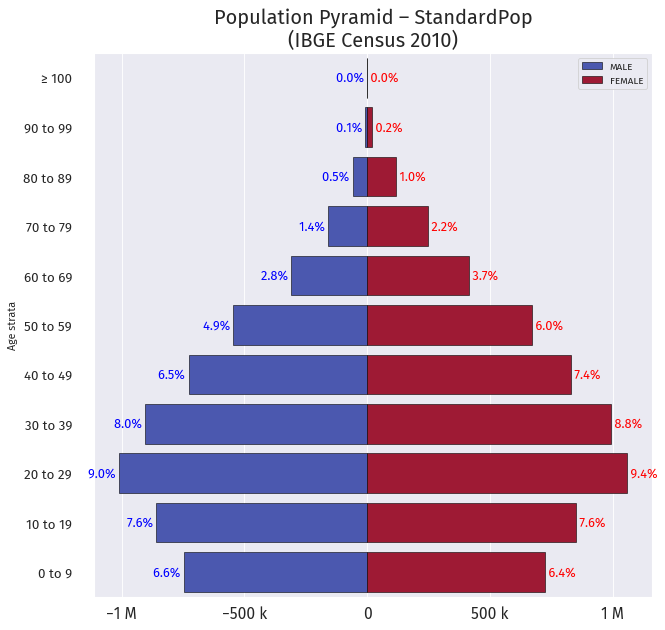

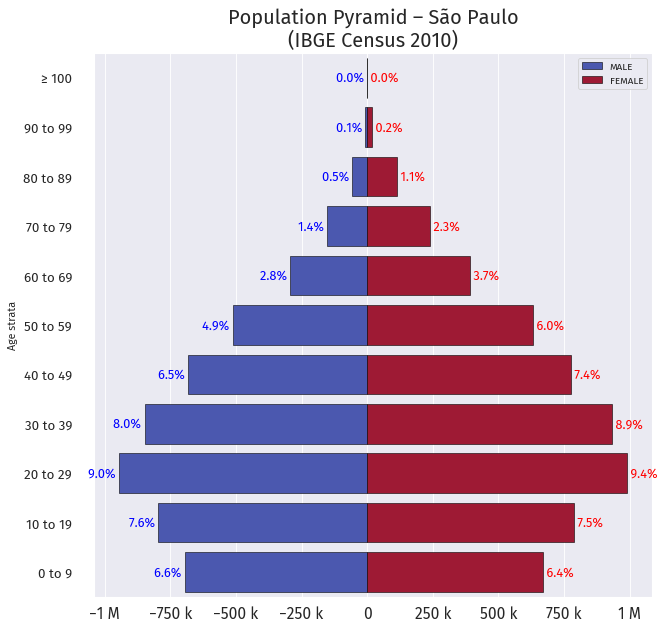

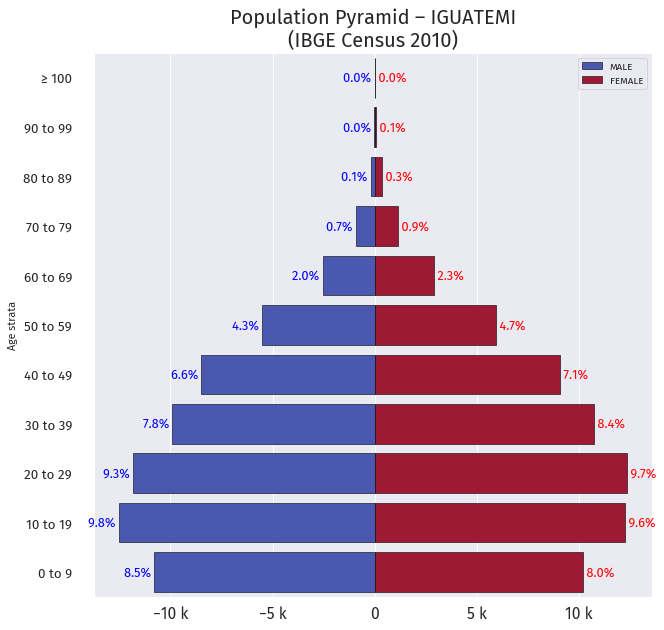

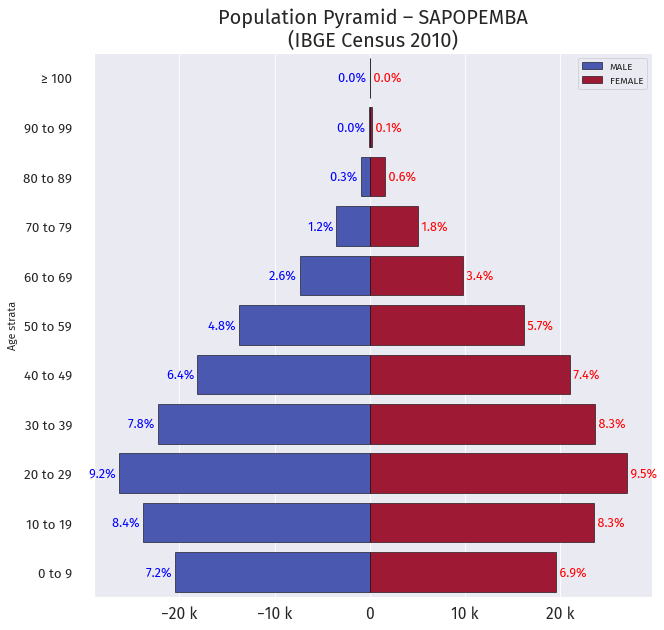

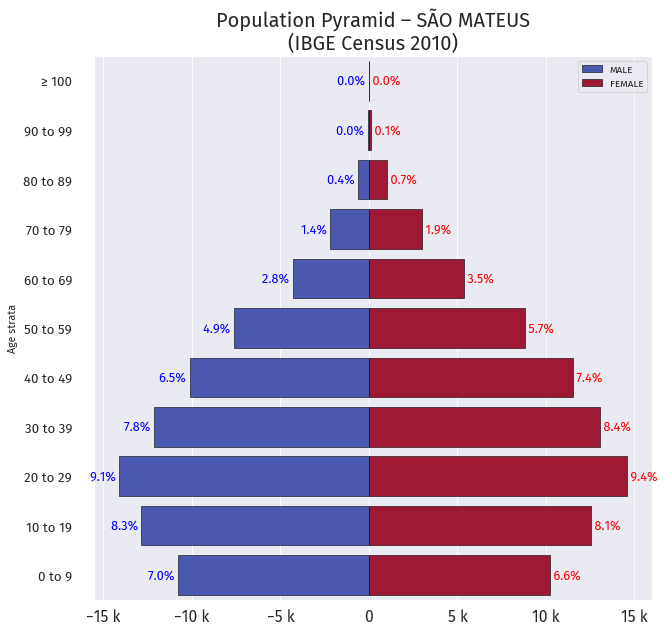

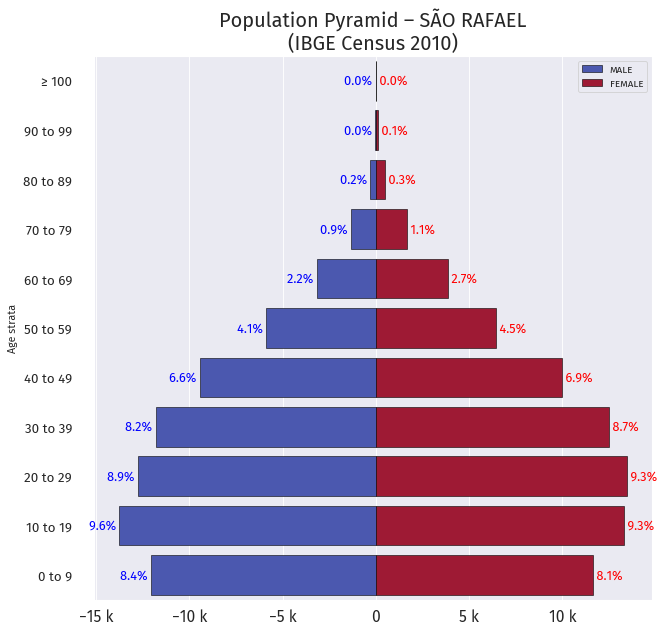

In [25]:
for reg in PopPyramidData.keys():
    plotPyramid(PopPyramidData[reg], reg, (9,9))